# Unsupervised Methods: Topic Modeling and Clustering

Collection of methods and models to make make a topic modeling analysis using unsupervised method. Functions referred to Blueprints for Text Analytics by Albrecht et al. (2021) with several adjustments to make it more clear. No ready-to-use functions at all because we're using other libraries thus it will not be convenient to wrap it again with another functions as there's a lot of parameteres to set. This notebook show several models, including:

- Nonnegative Matrix Factorization (NMF)
- Latent Semantic Analysis (LSA)
- Latent Dirichlet Allocation (LDA)

To be able to build the models, two libraries were employed:

- Topic Modeling Using sklearn
- Topic Modeling Using Gensim

If interested more in looking at the details/algorithms behind it, check <a href='https://medium.com/nanonets/topic-modeling-with-lsa-psla-lda-and-lda2vec-555ff65b0b05#:~:text=Latent%20Semantic%20Analysis%2C%20or%20LSA,and%20a%20topic%2Dterm%20matrix'>Topic Modeling with LSA, PLSA, LDA & lda2Vec by Joyce Xu</a>.

In [52]:
import pandas as pd
import numpy as np
import math
import regex as re
import sqlite3
from tqdm import tqdm
from datetime import datetime

from spacy.lang.en.stop_words import STOP_WORDS as stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF                           # to perform NMF decomposition
from sklearn.decomposition import TruncatedSVD                  # LSA (Semantic Analysis)
from sklearn.decomposition import LatentDirichletAllocation     # LDA, most populare method
import pyLDAvis.sklearn                                         # visualizing LDA

from gensim.corpora import Dictionary                           # dicitionary to place the tokenized words
from gensim.models import TfidfModel                            # tfidf transformation for gensim models
from gensim.models.nmf import Nmf
from gensim.models import LdaModel
from gensim.models.ldamulticore import LdaMulticore
from gensim.models.coherencemodel import CoherenceModel

import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

import warnings
warnings.filterwarnings("ignore")  # turn off/on the warnings, change parameter to "always" if you want to turn it on again

## Introduction of the Dataset

The dataset was taken from CNN News Articles from 2011 to 2022. The data were collected using a web crawler made by Hadas Unger. The data itself could be on <a href='https://www.kaggle.com/datasets/hadasu92/cnn-articles-after-basic-cleaning'>Kaggle</a>.

In [3]:
dateparse = lambda x: datetime.strptime(x, '%Y-%m-%d %H:%M:%S')

df = pd.read_csv('dataset/CNN_Articels_clean.csv', 
                 index_col='Index', 
                 parse_dates=['Date published'], date_parser=dateparse)
df.reset_index(drop=True)
df.sample(5)

,Author,Date published,Category,Section,Url,Headline,Description,Keywords,Second headline,Article text
Index,,,,,,,,,,
16692,"Joe Sutton, CNN",2022-02-09 14:14:29,news,us,https://www.cnn.com/2022/02/09/us/minnesota-se...,Minnesota authorities can't arrest or threaten...,A federal judge has approved a settlement proh...,"us, Minnesota authorities can't arrest or thre...",Minnesota authorities can't arrest or threaten...,(CNN)A federal judge has approved a settlemen...
20594,By,2012-10-09 12:28:15,news,europe,https://www.cnn.com/2012/10/09/world/europe/uk...,Police stunned by elderly couple's huge cannab...,British police have decided not to press any c...,"europe, Police stunned by elderly couple's hug...",Police stunned by elderly couple's huge cannab...,Story highlightsBritish police: Elderly couple...
30307,"Jill Martin, CNN",2017-04-24 20:17:27,sport,sport,https://www.cnn.com/2017/04/24/sport/isaiah-th...,Celtics' Isaiah Thomas: 'Mentally and emotiona...,Despite the pain of losing his sister in a car...,"sport, Celtics' Isaiah Thomas: 'Mentally and e...",Boston Celtics' Isaiah Thomas: 'Mentally and e...,Story highlightsChyna Thomas died in a single-...
25730,"Gary Morley, CNN",2015-05-01 06:43:14,sport,football,https://www.cnn.com/2015/05/01/football/david-...,David Beckham turns 40 - why booze and gamblin...,David Beckham has come a long way from the flo...,"football, David Beckham turns 40 - why booze a...",David Beckham turns 40 - why booze and gamblin...,(CNN)He's come a long way from the floppy-fri...
12612,"Keith Allen, Chris Boyette and Alex Medeiros, CNN",2021-11-21 20:44:05,news,us,https://www.cnn.com/2021/11/21/us/louis-vuitto...,"Oak Brook, Illinois, Louis Vuitton: 14 people ...",Surveillance video shows masked shoplifters po...,"us, Oak Brook, Illinois, Louis Vuitton: 14 peo...",14 people rushed into a Louis Vuitton store ou...,(CNN)At least 14 people forced their way into...


In [4]:
df.columns = ['author', 'date_published', 'cat', 'sect', 'url', 'headline', 
              'desc', 'keywords', 'sec_headline', 'text']

In [5]:
df = df[['author', 'date_published', 'cat', 'sect', 'headline', 'keywords', 'text']]
df.sample(5)

,author,date_published,cat,sect,headline,keywords,text
Index,,,,,,,
38592,"Alex Thomas and Ben Church, CNN",2020-02-18 11:56:50,sport,football,Moussa Marega: Ruud Gullit 'disappointed' pla...,"football, Moussa Marega: Ruud Gullit 'disappo...",(CNN)Dutch soccer legend Ruud Gullit says he ...
14894,"Eliott C. McLaughlin, CNN",2020-06-21 13:51:39,news,us,10 times hip-hop told you about black lives wh...,"us, 10 times hip-hop told you about black live...",(CNN)Hip-hop has been on this. Long before Da...
43325,"Ivana Kottasová, David Wilkinson, Max Foster a...",2021-10-29 17:00:21,news,europe,Queen Elizabeth II told to rest for at least t...,"europe, Queen Elizabeth II told to rest for at...",London (CNN)Britain's Queen Elizabeth II has b...
14080,"Katia Hetter, CNN",2021-10-09 10:02:46,health,health,Halloween 2021: How to trick or treat while st...,"health, Halloween 2021: How to trick or treat ...",(CNN)The pandemic is making me think about Ha...
2360,"Danya Gainor and Angela Dewan, CNN",2022-02-09 12:11:03,news,uk,Climate change: A giant donut-shaped machine j...,"uk, Climate change: A giant donut-shaped machi...",(CNN)There's no silver bullet to the climate ...


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37949 entries, 0 to 44997
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   author          37949 non-null  object        
 1   date_published  37949 non-null  datetime64[ns]
 2   cat             37949 non-null  object        
 3   sect            37949 non-null  object        
 4   headline        37949 non-null  object        
 5   keywords        37949 non-null  object        
 6   text            37940 non-null  object        
dtypes: datetime64[ns](1), object(6)
memory usage: 2.3+ MB


## Exploratory Data Analysis

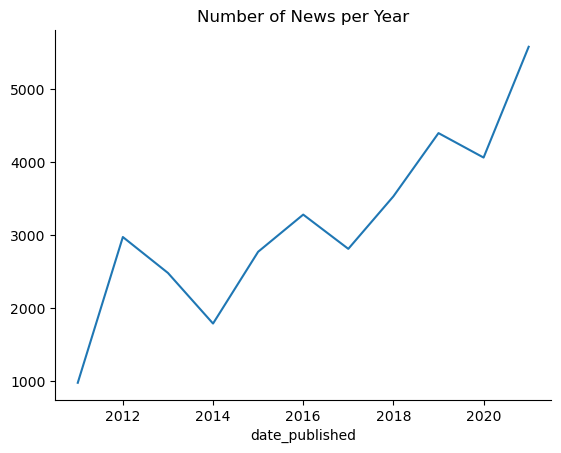

In [7]:
# plot number of news a year
# filter out 2022 as the data was collected in the middle of 2022, thus not apple-to-apple to compare

df[df['date_published'].dt.year != 2022].groupby(df['date_published'].dt.year)['text'].count().plot(title='Number of News per Year')
sns.despine()

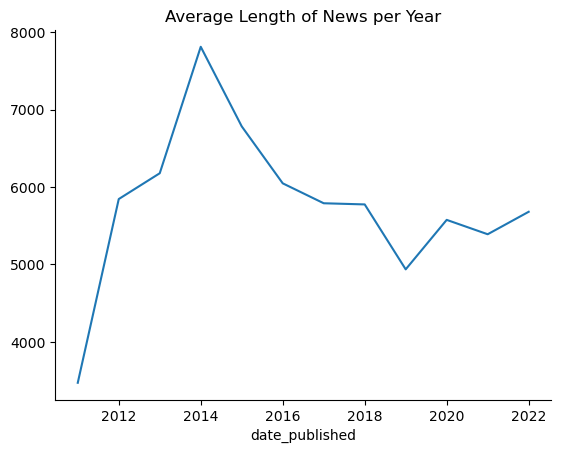

In [8]:
# average length news a year
# include 2022 as we're interested in calculating average

df['len_text'] = df['text'].map(str).map(len)
df.groupby(df['date_published'].dt.year)['len_text'].mean().plot(title='Average Length of News per Year')
sns.despine()

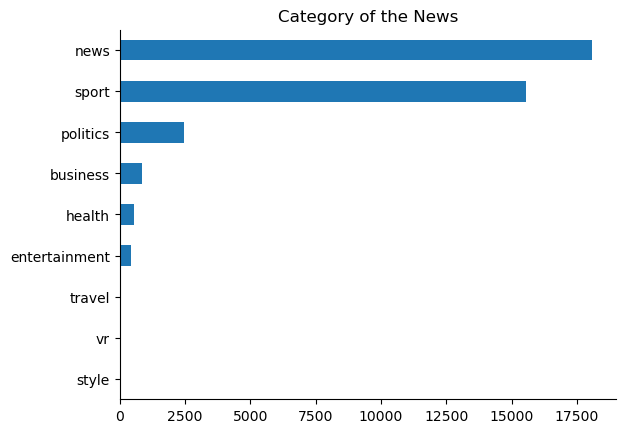

In [9]:
# showing top category of the news

df['cat'].value_counts().sort_values().plot(kind='barh', title='Category of the News')
sns.despine()

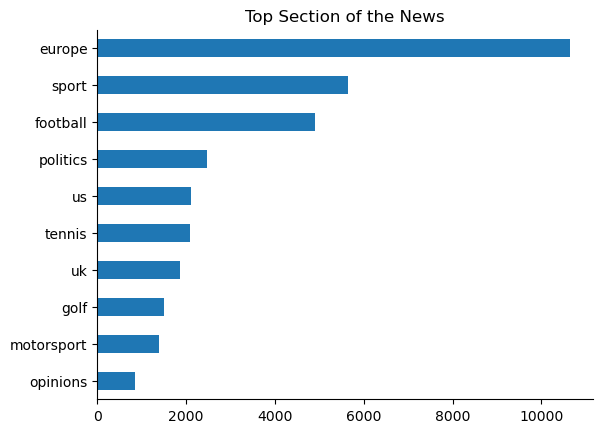

In [10]:
# showing the top section of the news
# only showing top 10 as there's a lot of them thus would be cluttered if we put all of them

df['sect'].value_counts().head(10).sort_values().plot(kind='barh', title='Top Section of the News')
sns.despine()

## Data Preparation

    Step 1: Data Cleaning    

In [11]:
import fun_nlp_spacy_text as TextClean

df['clean_text'] = df['text'].map(str).apply(TextClean.clean)
df['clean_text'] = df['text'].map(str).apply(TextClean.normalize)
df.sample(5)

,author,date_published,cat,sect,headline,keywords,text,len_text,clean_text
Index,,,,,,,,,
44506,"Jill Martin, CNN",2022-01-04 04:21:20,sport,sport,Becky Hammon on moving from NBA to WNBA: Las V...,"sport, Becky Hammon on moving from NBA to WNBA...",(CNN)Glass-ceiling breaker Becky Hammon has i...,2984,(CNN)Glass-ceiling breaker Becky Hammon has i...
43394,"Rob Picheta, CNN",2021-10-23 14:48:20,news,uk,Nicole Kidman joins Daniel Craig in donating t...,"uk, Nicole Kidman joins Daniel Craig in donati...",(CNN)Australian actress Nicole Kidman has mat...,2451,(CNN)Australian actress Nicole Kidman has mat...
31002,"Rob Hodgetts, CNN",2017-07-20 19:22:06,sport,golf,"The Open 2017: Jordan Spieth, Brooks Koepka, M...","golf, The Open 2017: Jordan Spieth, Brooks Koe...","Story highlightsSpieth, Koepka, Kuchar lead th...",12273,"Story highlightsSpieth, Koepka, Kuchar lead th..."
7915,"Analysis by Stephen Collinson, CNN",2021-06-03 18:15:59,news,world,The big test of America's great reopening is c...,"world, The big test of America's great reopeni...",This was excerpted from the June 3 edition of ...,5329,This was excerpted from the June 3 edition of ...
28079,"Piers Edwards, CNN",2016-06-17 11:04:58,sport,football,"Euro 2016: Quantity, not quality? - CNN","Euro 2016, Ancelotti, Euro 2016 24 teams, Euro...",Story highlightsEuro 2016 features 24 teamsEig...,11282,Story highlightsEuro 2016 features 24 teamsEig...


In [12]:
# customized text cleaning function, looking at the data

def normalize_custom(text):
    text = re.sub(r'\(CNN\)', '', text)             # Removing '(CNN)' 
    text = re.sub(r'\(CNN\s\w+\)', '', text)        # Removing '(CNN xxx)' 
    text = re.sub(r'Story highlights ?', '', text)  # Removing 'Story highlights'
    
    return text

df['clean_text'] = df['clean_text'].map(normalize_custom)
df.sample(5)

,author,date_published,cat,sect,headline,keywords,text,len_text,clean_text
Index,,,,,,,,,
40215,"Cesar Marin, CNN",2020-09-13 01:58:52,sport,sport,MLB game delayed after armed standoff outside ...,"sport, MLB game delayed after armed standoff o...",(CNN)The first pitch of the game between the ...,1122,The first pitch of the game between the Kansa...
40733,"Paul Gittings, CNN",2020-11-14 23:26:35,sport,golf,Dustin Johnson leads Masters by four shots - CNN,"golf, Dustin Johnson leads Masters by four sho...",(CNN)Dustin Johnson lived up to his billing a...,4708,Dustin Johnson lived up to his billing as the...
20602,By,2012-10-08 20:53:07,sport,football,Rodgers defends Liverpool's Suarez amid accusa...,"football, Rodgers defends Liverpool's Suarez a...",Story highlightsLiverpool boss Brendan Rodgers...,3987,Liverpool boss Brendan Rodgers defends Luis Su...
15623,"Katie Polglase, Noon Salih and Zeena Saifi, CNN",2021-11-10 17:05:20,news,africa,Amnesty International accuses TPLF rebel fight...,"africa, Amnesty International accuses TPLF reb...",(CNN)Fighters from Ethiopia's northern Tigray...,4560,Fighters from Ethiopia's northern Tigray regi...
30540,Marilia Brocchetto and Sandrine Amiel CNN,2017-05-20 18:03:16,news,europe,Suspect under investigation in Champs-Elysees ...,"europe, Suspect under investigation in Champs-...",Story highlightsOne police officer died in the...,1882,One police officer died in the attack The assa...


In [13]:
df['clean_text'].sample(15)

Index
30462    "Right now, Nadal has a huge amount of locker ...
33027    Mexico beat Germany 1-0Hirving Lazano scores o...
6244      Newly released footage from January 6 shows a...
38380     The man responsible for racially abusing Engl...
44141     Mercedes' F1 team announced on Wednesday that...
11698    Francesca Cesari's intimate photos show women ...
20722    Maria Alyokhina and another punk band member w...
42377    London Britain's Metropolitan Police has confi...
39127     Steph Curry raised the spirits of a group of ...
20942    South African veteran earns luxury car after h...
25634     Argentine fans were labeled as "sick" by Boca...
13865     Kash Patel, a former chief of staff to then-a...
10631     Carol Burnett is now a major part of Golden G...
27349    Afghanistan beats West Indies First win at Twe...
34575     A stampede at a rap concert early Saturday in...
Name: clean_text, dtype: object

In [14]:
# save dataframe into a database

db_name = 'cnn-news.db'
con = sqlite3.connect(db_name)
df.to_sql('cnn-news-cleaned', con, index=False, if_exists='replace')
con.close()

### Dataset Checkpoint!

In [4]:
db_name = 'cnn-news.db'
con = sqlite3.connect(db_name)
df = pd.read_sql("SELECT * FROM 'cnn-news-cleaned'", con)
con.close()

df.head(5)

,author,date_published,cat,sect,headline,keywords,text,len_text,clean_text
0,"Jacopo Prisco, CNN",2021-07-15 02:46:59,news,world,"There's a shortage of truckers, but TuSimple t...","world, There's a shortage of truckers, but TuS...","(CNN)Right now, there's a shortage of truck d...",12361,"Right now, there's a shortage of truck driver..."
1,"Stephanie Bailey, CNN",2021-05-12 07:52:09,news,world,Bioservo's robotic 'Ironhand' could protect fa...,"world, Bioservo's robotic 'Ironhand' could pro...",(CNN)Working in a factory or warehouse can me...,5815,Working in a factory or warehouse can mean do...
2,"Words by Stephanie Bailey, video by Zahra Jamshed",2021-06-16 02:51:30,news,asia,This swarm of robots gets smarter the more it ...,"asia, This swarm of robots gets smarter the mo...","(CNN)In a Hong Kong warehouse, a swarm of aut...",3419,"In a Hong Kong warehouse, a swarm of autonomo..."
3,Kathryn Vasel,2022-03-18 14:37:21,business,success,"Two years later, remote work has changed milli...","success, Two years later, remote work has chan...",The pandemic thrust the working world into a n...,14951,The pandemic thrust the working world into a n...
4,"Paul R. La Monica, CNN Business",2022-03-19 11:41:08,business,investing,Why March is so volatile for stocks - CNN,"investing, Why March is so volatile for stocks...",New York (CNN Business)March Madness isn't jus...,2805,New York March Madness isn't just for college ...


    Step 2: Vectorizing Data    

In [5]:
# vectorizing data
# if we want to vectorize data based on paragraph, see book page 211

from sklearn.feature_extraction.text import TfidfVectorizer
from spacy.lang.en.stop_words import STOP_WORDS as stopwords

tfidf_text = TfidfVectorizer(stop_words=stopwords, min_df=5, max_df=0.7)
vectors_text = tfidf_text.fit_transform(df['clean_text'])
vectors_text.shape

(37949, 68621)

# Topic Modeling

## Nonnegative Matrix Factorization (NMF)

NMF is a statistical method that helps us to reduce the dimension of the input corpora or corpora. Internally, it uses the factor analysis method to give comparatively less weightage to the words that are having less coherence. It decomposes the data as a matrix M (corpus) into the product of two lower ranking matrices W (weightage of each word gets in each sentence) and H (word embedding). The sub-matrix W contains the NMF basis; the sub-matrix H contains the associated coefficients (weights).

In other words, we have:
- First matrix (W): It has every topic and what terms in it,
- Second matrix (H): It has every document and what topics in it.

Learn more here: 
- <a href='https://medium.com/codex/what-is-non-negative-matrix-factorization-nmf-32663fb4d65#:~:text=Non%2Dnegative%20Matrix%20Factorization%20or,data%20into%20lower%2Ddimensional%20spaces.'>What is Non-Negative Matrix Factorization (NMF)? by Salman Ibne Eneus</a>
- <a href='https://www.analyticsvidhya.com/blog/2021/06/part-15-step-by-step-guide-to-master-nlp-topic-modelling-using-nmf/#:~:text=your%20NLP%20Journey-,Non%2DNegative%20Matrix%20Factorization%20(NMF),that%20are%20having%20less%20coherence.'>Step by Step Guide to Master NLP – Topic Modelling using NMF by Analytics Vidhya</a>

    Step 1: Prepare the Data

In [6]:
# vectorize the text first

from sklearn.decomposition import NMF

nmf_text_model = NMF(n_components=10,   # choose number of topics we want to look
                     random_state=42    # random state, to make the randomization constant
                     )

w_text_matrix = nmf_text_model.fit_transform(vectors_text)
h_text_matrix = nmf_text_model.components_

    Build a Function to Display the Topics    

In [7]:
# build the function

def display_topics(model, features, n_top_words=5):
    for topic, word_vector in enumerate(model.components_):
        
        total = word_vector.sum()
        largest = word_vector.argsort()[::-1]
        print(f'\nTopic {topic}:')
        for i in range(0, n_top_words):
            print(' %s (%2.2f)' % (features[largest[i]], word_vector[largest[i]] * 100.0/total))

In [8]:
# display the topics from the model we built before

display_topics(nmf_text_model, tfidf_text.get_feature_names(), n_top_words=5)


Topic 0:
 trump (0.51)
 covid (0.25)
 president (0.25)
 biden (0.24)
 people (0.24)

Topic 1:
 photos (5.62)
 caption (4.96)
 hide (4.75)
 ukrainecrisis (0.41)
 10 (0.33)

Topic 2:
 djokovic (1.04)
 open (0.97)
 nadal (0.96)
 federer (0.94)
 tennis (0.86)

Topic 3:
 league (0.91)
 club (0.55)
 football (0.55)
 champions (0.43)
 cup (0.40)

Topic 4:
 ukraine (2.06)
 russia (1.97)
 russian (1.85)
 putin (1.27)
 ukrainian (0.87)

Topic 5:
 brexit (1.98)
 eu (1.42)
 uk (1.12)
 johnson (0.95)
 deal (0.88)

Topic 6:
 f1 (1.35)
 hamilton (1.25)
 race (1.08)
 vettel (0.93)
 formula (0.89)

Topic 7:
 woods (1.41)
 golf (1.37)
 mcilroy (0.71)
 pga (0.71)
 tiger (0.69)

Topic 8:
 police (1.14)
 attack (0.34)
 people (0.31)
 officers (0.29)
 arrested (0.24)

Topic 9:
 prince (1.69)
 royal (1.58)
 queen (1.23)
 harry (1.08)
 meghan (0.90)


## Latent Semantic Analysis/Indexing

Method to analyze relationships between a set of documents and the terms they contain by producing a set of concepts related to the documents and terms. The core idea is to take a matrix of what we have — documents and terms — and decompose it into a separate document-topic matrix and a topic-term matrix.

In [9]:
# build the model
# the interface looks similar to NMF

from sklearn.decomposition import TruncatedSVD

svd_text_model = TruncatedSVD(n_components=10,      # number of topics
                              random_state=42       # random state, to make the randomization constant 
                              )

w_svd_matrix = svd_text_model.fit_transform(vectors_text)
h_svd_matrix = svd_text_model.components_

In [10]:
# employing the previous display_topics() function
display_topics(svd_text_model, tfidf_text.get_feature_names(), n_top_words=5)


Topic 0:
 photos (0.35)
 caption (0.31)
 hide (0.30)
 world (0.18)
 year (0.15)

Topic 1:
 photos (-2.03)
 caption (-1.79)
 hide (-1.72)
 cup (-0.18)
 ukrainecrisis (-0.16)

Topic 2:
 photos (-39.34)
 caption (-32.24)
 hide (-31.14)
 ukraine (-27.66)
 russia (-22.41)

Topic 3:
 open (-13.75)
 djokovic (-12.47)
 nadal (-11.51)
 federer (-11.26)
 tennis (-10.22)

Topic 4:
 ukraine (-6.35)
 russia (-5.90)
 russian (-5.55)
 putin (-3.80)
 ukrainian (-2.69)

Topic 5:
 brexit (-3.49)
 eu (-2.44)
 uk (-1.63)
 johnson (-1.53)
 deal (-1.52)

Topic 6:
 f1 (-10.86)
 hamilton (-10.18)
 race (-8.44)
 vettel (-7.62)
 formula (-7.07)

Topic 7:
 woods (15.92)
 golf (15.50)
 trump (12.52)
 tiger (7.73)
 pga (7.70)

Topic 8:
 trump (-165.60)
 biden (-67.40)
 president (-53.49)
 election (-47.11)
 republican (-38.76)

Topic 9:
 prince (6.64)
 royal (6.08)
 covid (5.79)
 queen (4.87)
 olympic (4.51)


In [11]:
# check the size of the topics
svd_text_model.singular_values_

array([31.55313768, 21.06402327, 18.98059121, 15.78104806, 15.02807026,
       14.23413954, 14.02298539, 13.22368257, 12.81731331, 12.18549516])

# Latent Dirichlet Allocation (LDA)

**LDA is the most prominent method of topic modeling**. Using this method, LDA views every document contains a variety of topics. In other words, each document contains a variety of subjects. The same is true of topics and words. LDA uses a so-called Dirichlet prior, which employs a Dirichlet distribution in the beginning to limit the number of topics per document and to ensure that the topics consist of only a small number of key words. This is used to give documents topics and to come up with words to go with those topics. The Dirichlet distribution makes sure that topics are primarily defined by a small number of words and that there are only a few topics per document.

Most important points in this method:
- LDA doesn't employ TF-IDF for vectorization, but instead using CountVecotrizer
- LDA is a probabilistic model that tries to estimate probability distributions for topics in documents and words in topics
- No need the weighting of TF-IDF

Remember this method **takes time longer** than previous models as it utilizes probability.

In [12]:
# vectorizing text using COUNT VECTORIZER

from sklearn.feature_extraction.text import CountVectorizer

count_vectorizer = CountVectorizer(stop_words=stopwords, min_df=5, max_df=0.7)
count_vector = count_vectorizer.fit_transform(df['clean_text'])

# applying LDA to our data

from sklearn.decomposition import LatentDirichletAllocation

lda_model = LatentDirichletAllocation(n_components=10, random_state=42)
w_lda_matrix = lda_model.fit_transform(count_vector)
h_lda_matrix = lda_model.components_

In [13]:
# display topics using the lda model
display_topics(lda_model, count_vectorizer.get_feature_names())


Topic 0:
 world (0.99)
 team (0.90)
 league (0.84)
 cup (0.72)
 football (0.72)

Topic 1:
 people (0.56)
 royal (0.53)
 prince (0.52)
 life (0.46)
 new (0.45)

Topic 2:
 photos (6.90)
 caption (4.57)
 hide (4.56)
 ukraine (3.17)
 crisis (1.92)

Topic 3:
 open (1.56)
 year (0.89)
 golf (0.75)
 tennis (0.70)
 round (0.67)

Topic 4:
 trump (0.92)
 president (0.83)
 court (0.47)
 election (0.46)
 cnn (0.45)

Topic 5:
 people (0.77)
 new (0.49)
 cnn (0.40)
 says (0.38)
 year (0.37)

Topic 6:
 photos (13.74)
 caption (10.41)
 hide (10.13)
 best (3.81)
 2012 (2.13)

Topic 7:
 russia (1.19)
 russian (0.96)
 coronavirus (0.78)
 government (0.65)
 minister (0.62)

Topic 8:
 police (1.32)
 people (0.74)
 cnn (0.59)
 told (0.57)
 attack (0.40)

Topic 9:
 race (1.60)
 f1 (0.98)
 formula (0.81)
 team (0.77)
 hamilton (0.71)


    Visualizing LDA Result

In [14]:
import pyLDAvis.sklearn

lda_display = pyLDAvis.sklearn.prepare(lda_model,           # pass the model we built
                                       count_vector,        # pass the vector
                                       count_vectorizer,    # pass the vectorizer
                                       sort_topics=False    # sorting topics
                                       )
pyLDAvis.display(lda_display)

# Visualization

## Word Cloud
Using word cloud to compare the topics for each model. Built the function for it, thus it would be used for all of the methods here.

In [15]:
def wordcloud_topics(model, features, n_top_words, n_topics):

    fig = plt.figure(figsize=(10,20))
    ci = 0
    n_subplot = math.ceil(n_topics/2)
    
    for topic, words in enumerate(model.components_):
        size = {}
        largest = words.argsort()[::-1]
        for i in range(0, n_top_words):
            size[features[largest[i]]] = abs(words[largest[i]])
        
        wc = WordCloud(background_color='white', max_words=100,
                       width=960, height=540)
        wc = wc.generate_from_frequencies(size)
        #plt.figure(figsize=(6,6))
        #plt.imshow(wc, interpolation='bilinear')
        #plt.axis('off')
        
        ax = fig.add_subplot(n_subplot, 2, ci+1)
        ax.imshow(wc, interpolation='bilinear')
        ax.axis('off')
        ax.set_title(f'Topic: {topic}')
        ci += 1
     
    plt.tight_layout() 
    plt.show()

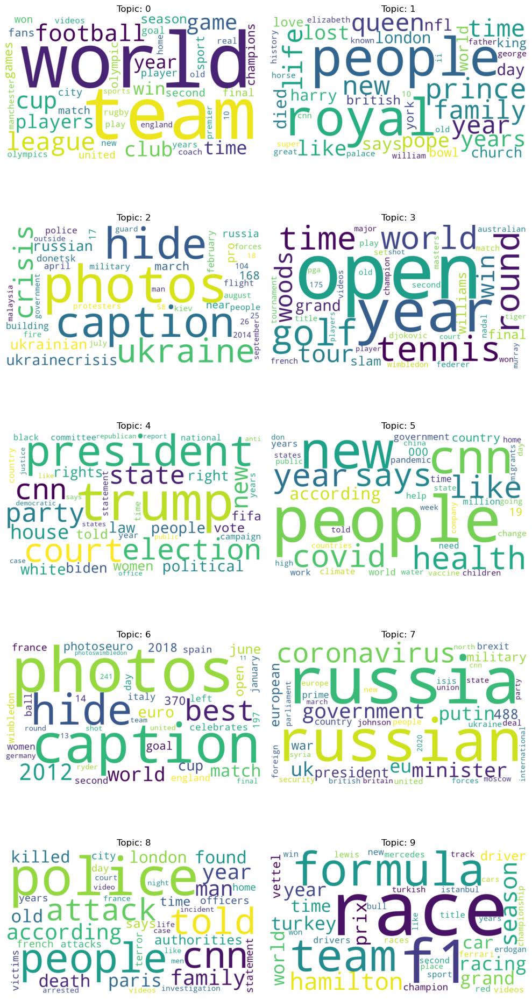

In [16]:
# plot for lda model
wordcloud_topics(lda_model, count_vectorizer.get_feature_names_out(), n_top_words=40, n_topics=10)

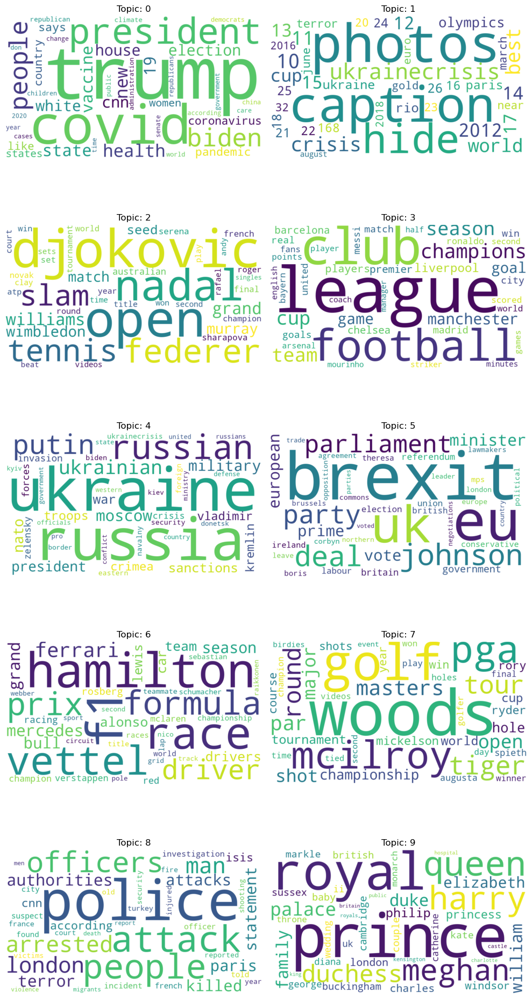

In [17]:
# plot for nmf model
wordcloud_topics(nmf_text_model, tfidf_text.get_feature_names_out(), n_top_words=40, n_topics=10)

## Topic Distribution of Documents and Time Evolution
Analyze the popular topic and its evolution over the time.

In [19]:
# sum the topic in each year

df['year'] = pd.DatetimeIndex(df['date_published']).year
year_data = []
years = np.unique(df['year'])

for year in tqdm(years):
    w_year = nmf_text_model.transform(vectors_text[df['year'] == year])
    year_data.append([year] + list(w_year.sum(axis=0) / w_year.sum()*100.0))

100%|██████████| 12/12 [00:01<00:00,  6.30it/s]


year,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
Topic trump covid,5.615295,3.715669,3.998257,4.278991,9.062985,8.613979,10.382639,11.697306,10.470175,21.019593,24.584177,24.909955
Topic photos caption,1.427291,15.449684,16.693943,19.702472,18.579215,20.457764,14.134160,12.260589,7.115321,4.506085,4.450788,3.759995
Topic djokovic open,12.084030,13.443384,13.374654,10.582492,8.410680,8.920729,6.945725,6.403617,7.474567,7.434762,6.468663,4.477065
Topic league club,24.055902,19.390029,17.277593,8.153027,13.802885,12.859105,9.460178,11.183574,16.785119,17.836933,14.956246,6.869567
Topic ukraine russia,6.273812,3.709937,3.935870,21.809099,7.213042,4.505588,6.109067,7.635744,4.388642,4.532879,5.619028,31.195390
Topic brexit eu,7.485270,4.164548,3.945760,3.142393,3.596279,7.568971,12.539536,10.728935,17.562523,7.492677,6.139444,3.290721
Topic f1 hamilton,11.418612,9.751574,9.931198,6.357654,7.358344,7.768788,7.502932,6.589934,5.989213,6.281411,5.008593,2.686100
Topic woods golf,14.883266,11.829418,11.564184,8.902995,8.070842,7.989631,7.942851,8.393777,6.250514,6.888192,7.188318,3.936398
Topic police attack,12.331022,11.762866,11.433733,11.788432,17.805489,15.865061,17.757584,14.355132,14.081768,14.410996,14.739458,13.579494
Topic prince royal,4.425500,6.782890,7.844807,5.282444,6.100239,5.450383,7.225328,10.751392,9.882157,9.596471,10.845286,5.295314


<AxesSubplot:xlabel='year'>

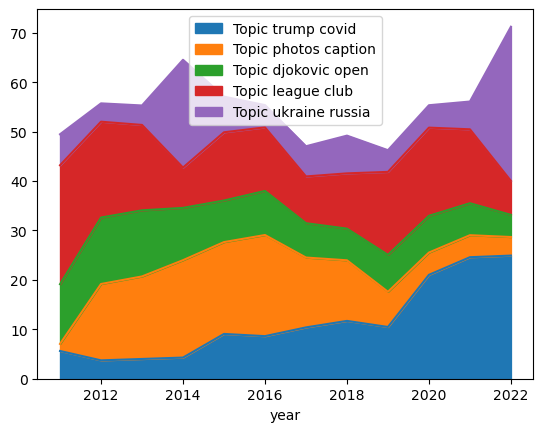

In [20]:
# make topic names from top 2 words in each topic

topic_names = []
voc = tfidf_text.get_feature_names_out()
for topic in nmf_text_model.components_:
    important = topic.argsort()
    top_word = voc[important[-1]] + ' ' + voc[important[-2]]
    topic_names.append('Topic ' + top_word)

# append in a dataframe

df_year = pd.DataFrame(year_data, columns=['year'] + topic_names).set_index('year')
display(df_year.T)
df_year.iloc[:,:5].plot.area()

Not really a good model to visualize, for example Trump is combined with Covid. Because of that, the covid topic appears during the initial years. But at least we get a good idea on how to it.

# Using Gensim for Topic Modeling

Gensim is another tool (library) besides sklearn to conduct topic modeling analysis. There are pros and cons by using these two libraries. Gensim allows users to leverage GPUs even on distributed platforms, whereas Sklearn only supports multicore processing. It should be noted that while gensim requires adequate optimization and regulation, sklearn appears to have a reasonably effective method for convergence. Other than that, Gensim has a method to estimate the quality of the modeling, which is important to know.

The step is totally different compared by using sklearn.

As also it takes more time for Gensim compared to sklearn, I will only subset the data which is published above 2020 (recent news)

In [21]:
df_gensim = df[df['date_published'] > '2020-01-01 00:00:01']

print('before subsetting:', len(df))
print('after subsetting:', len(df_gensim))

before subsetting: 37949
after subsetting: 12942


## Data Preparation

    Create token and build a dictionary based on the tokens

In [22]:
gensim_text = [[w for w in re.findall(r'\b\w\w+\b', text.lower())
                    if w not in stopwords]
                        for text in df_gensim['clean_text']]
gensim_text

[['right',
  'shortage',
  'truck',
  'drivers',
  'worldwide',
  'exacerbated',
  'commerce',
  'boom',
  'brought',
  'pandemic',
  'solution',
  'problem',
  'autonomous',
  'trucks',
  'companies',
  'race',
  'launch',
  'san',
  'diego',
  'based',
  'tusimple',
  'founded',
  '2015',
  'tusimple',
  'completed',
  'million',
  'miles',
  'road',
  'tests',
  '70',
  'prototype',
  'trucks',
  'china',
  'europe',
  'simply',
  'commercially',
  'available',
  'trucks',
  'retrofitted',
  'technology',
  'tusimple',
  'deals',
  'place',
  'world',
  'largest',
  'truck',
  'manufacturers',
  'navistar',
  'traton',
  'volkswagen',
  'trucking',
  'business',
  'europe',
  'design',
  'build',
  'fully',
  'autonomous',
  'models',
  'hopes',
  'launch',
  '2024',
  'photos',
  'yara',
  'birkeland',
  'builders',
  'world',
  'zero',
  'emission',
  'autonomous',
  'cargo',
  'ship',
  'ship',
  'scheduled',
  'journey',
  'norwegian',
  'towns',
  'end',
  'year',
  'click',
  

In [23]:
# generate dictionary

from gensim.corpora import Dictionary
dict_gensim_text = Dictionary(gensim_text)

    Set some parameters
    
Similar to filter parameter in scikit-learn min_df, and max_df

In [24]:
dict_gensim_text.filter_extremes(no_below=5,    # min_df
                                 no_above=0.7)  # max_df

    Calculate Bag-of-Words

In [25]:
bow_gensim_text = [dict_gensim_text.doc2bow(text) \
                   for text in gensim_text]

    Vectorization for TF-IDF

In [26]:
from gensim.models import TfidfModel

tfidf_gensim_text = TfidfModel(bow_gensim_text)  # pass the bag of words here for the parameter
vector_gensim_text = tfidf_gensim_text[bow_gensim_text]  # create the vector for it

## Performing Model: NMF with Gensim

In [27]:
from gensim.models.nmf import Nmf

nmf_gensim_text = Nmf(vector_gensim_text,       # pass the vector
                      num_topics=10,            # number of topics we want to see
                      id2word=dict_gensim_text, # pass the dictionary from the text
                      kappa=0.1,                # optimization parameter
                      eval_every=5              # optimization parameter
                      )

In [28]:
# show topic with gensim style
nmf_gensim_text.show_topics()

[(0,
  '0.020*"ukraine" + 0.017*"russia" + 0.014*"russian" + 0.011*"putin" + 0.008*"ukrainian" + 0.006*"nato" + 0.006*"zelensky" + 0.005*"war" + 0.005*"invasion" + 0.004*"moscow"'),
 (1,
  '0.027*"trump" + 0.012*"election" + 0.006*"republican" + 0.006*"committee" + 0.005*"president" + 0.004*"gop" + 0.004*"court" + 0.004*"campaign" + 0.004*"donald" + 0.004*"republicans"'),
 (2,
  '0.004*"league" + 0.004*"vaccine" + 0.004*"johnson" + 0.004*"uk" + 0.004*"covid" + 0.003*"coronavirus" + 0.003*"players" + 0.003*"19" + 0.002*"health" + 0.002*"club"'),
 (3,
  '0.014*"biden" + 0.013*"trump" + 0.006*"election" + 0.006*"democrats" + 0.006*"president" + 0.005*"white" + 0.005*"house" + 0.005*"republican" + 0.005*"senate" + 0.005*"republicans"'),
 (4,
  '0.007*"police" + 0.004*"photos" + 0.004*"caption" + 0.004*"hide" + 0.003*"officers" + 0.002*"court" + 0.002*"man" + 0.002*"investigation" + 0.002*"officer" + 0.002*"county"'),
 (5,
  '0.010*"china" + 0.006*"russia" + 0.006*"putin" + 0.006*"chinese" 

    Evaluating Using Coherence Score for Topic Models    

In [29]:
from gensim.models.coherencemodel import CoherenceModel

nmf_gensim_text_coherence = CoherenceModel(model=nmf_gensim_text,       # pass the model
                                           texts=gensim_text,           # pass tokenized tet
                                           dictionary=dict_gensim_text, # pass the dictionary here
                                           coherence='c_v'              # optimization parameter
                                           )

print('Coherence Score: ', nmf_gensim_text_coherence.get_coherence())

Coherence Score:  0.6391828530308861


## Performing Model: LDA with Gensim

In [31]:
# no need to preparing text again
# already done in the previous steps

from gensim.models import LdaModel
lda_gensim_text = LdaModel(corpus=bow_gensim_text,
                           id2word=dict_gensim_text,
                           chunksize=2000,
                           alpha='auto',
                           eta='auto',
                           iterations=400,
                           num_topics=10,
                           passes=2,
                           eval_every=None,
                           random_state=42
                           )

lda_gensim_text.show_topics()

[(0,
  '0.014*"covid" + 0.011*"19" + 0.010*"people" + 0.008*"health" + 0.007*"coronavirus" + 0.007*"vaccine" + 0.007*"uk" + 0.006*"new" + 0.006*"johnson" + 0.005*"government"'),
 (1,
  '0.015*"trump" + 0.012*"president" + 0.011*"court" + 0.006*"election" + 0.006*"biden" + 0.006*"house" + 0.005*"party" + 0.005*"cnn" + 0.005*"committee" + 0.004*"january"'),
 (2,
  '0.008*"people" + 0.007*"family" + 0.005*"black" + 0.005*"like" + 0.004*"year" + 0.004*"cnn" + 0.004*"time" + 0.004*"life" + 0.004*"says" + 0.004*"years"'),
 (3,
  '0.011*"team" + 0.008*"players" + 0.008*"game" + 0.007*"games" + 0.007*"year" + 0.007*"time" + 0.007*"world" + 0.006*"sport" + 0.006*"league" + 0.006*"nfl"'),
 (4,
  '0.007*"golf" + 0.005*"climate" + 0.005*"312" + 0.005*"pandemica" + 0.004*"new" + 0.004*"water" + 0.004*"people" + 0.004*"year" + 0.004*"years" + 0.004*"australia"'),
 (5,
  '0.008*"biden" + 0.006*"election" + 0.006*"year" + 0.005*"new" + 0.005*"president" + 0.004*"state" + 0.004*"vote" + 0.004*"million"

    Evaluate Coherence Score for LDA Model

In [33]:
# calculating coherence score for LDA model
# just change the parameter for the model

from gensim.models.coherencemodel import CoherenceModel

lda_gensim_text_coherence = CoherenceModel(model=lda_gensim_text,       # pass the model
                                           texts=gensim_text,           # pass tokenized tet
                                           dictionary=dict_gensim_text, # pass the dictionary here
                                           coherence='c_v'              # optimization parameter
                                           )

print('Coherence Score: ', lda_gensim_text_coherence.get_coherence())

Coherence Score:  0.4875660701079645


In [34]:
# calculate average topic coherence

top_topics = lda_gensim_text.top_topics(vector_gensim_text, topn=5)
avg_topic_coherence = sum(t[1] for t in top_topics) / len(top_topics)
print(f'Average topic coherence : {avg_topic_coherence}')

Average topic coherence : -1.5101905974768273


In [35]:
# calculating coherence score of the individual topics
# this method only can be found for lda models

[(t[1], ' '.join([w[1] for w in t[0]])) for t in top_topics]

[(-0.48125553791467174, 'state cnn according new told'),
 (-0.507097142006196, 'police cnn government told people'),
 (-0.5303841720061542, 'biden election year new president'),
 (-0.6992650383814868, 'team players game games year'),
 (-0.6999235133330775, 'covid 19 people health coronavirus'),
 (-0.7337603469233017, 'people family black like year'),
 (-1.00363799660947, 'trump president court election biden'),
 (-1.635825094865541, 'russia photos hide caption ukraine'),
 (-2.1737614678996726, 'photos caption hide coronavirus 488'),
 (-6.6369956648286985, 'golf climate 312 pandemica new')]

    Deciding Number of Topics with The Best Coherence Score

In [41]:
# using LDA Multi Core to fasten the process as using paralellized process
# but we can change it to the other models if we want

from gensim.models.ldamulticore import LdaMulticore

coherence_scores = []

for n in tqdm(range(5, 13)):  # we can change the range to choose how many topics are we going to investigate
    lda_model = LdaModel(corpus=bow_gensim_text,
                         id2word=dict_gensim_text,
                         chunksize=2000,
                         alpha='auto',
                         eta='auto',
                         iterations=400,
                         num_topics=n,
                         passes=2,
                         eval_every=None,
                         random_state=42
                         )
    lda_coherence = CoherenceModel(model=lda_model,             # pass the model
                                   texts=gensim_text,           # pass tokenized tet
                                   dictionary=dict_gensim_text, # pass the dictionary here
                                   coherence='c_v'              # optimization parameter
                                   )
    
    coherence_scores.append((n, lda_model, lda_coherence.get_coherence()))

100%|██████████| 8/8 [19:20<00:00, 145.10s/it]


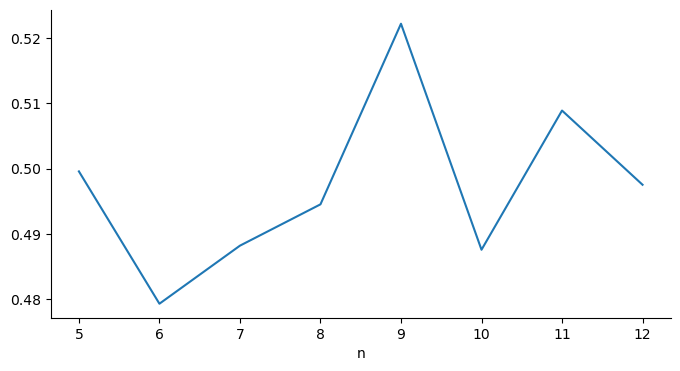

In [49]:
# coherence score has the highest score at 9
# when the scale of y is around 0.48 - 0.52

pd.DataFrame(coherence_scores, columns=['n', 'model', 'coh_score']).set_index('n')['coh_score'].plot(figsize=(8, 4))
sns.despine()

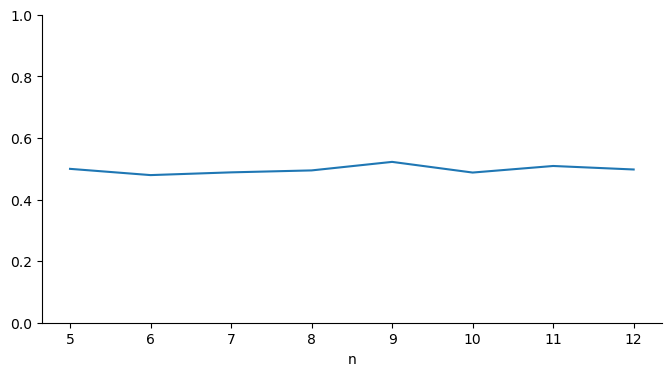

In [48]:
# if we zoom out with y-scale is from 0 to 1 the difference look very subtle

pd.DataFrame(coherence_scores, columns=['n', 'model', 'coh_score']).set_index('n')['coh_score'].plot(figsize=(8, 4), ylim=(0,1))
sns.despine()

## Performing Model: Hierarchical Dirichlet Process (HDP) with Gensim

HDP is a method to give us a few well separated broad topics, then go into more dtail by adding more words and differentiated topic definitions. It is something similar to category 1 and category 2, where category 1 usually shows a broader category. However, this **method is still under development**, thus should be taken by a grain of salt.

In [51]:
# WILL NOT BE CONDUCTED HERE
# IF INTERESTED, TAKE A LOOK AT PAGE 236

# Use Clustering to Make a Unsupervised Learning Model

Other than topic modelling, we can use clustering method to label a topic to our documents. There are several things to consider if we decided to use clustering:
1. Only suitable for corpus that contain short documents, if long, use topic modeling
2. It takes time, much longer. Thus, we've to wait for a long hour if we want to use clustering.

# Limitations

The analysis shown in this notebook doesn't use paragraph for analysis, but instead the document/news itself. Even though each news has own topic, each news is built by paragraphs with their own topics. Thus, it would be better for this unsupervised learning, for text from news data, to **use paragraph instead of the news itself**. On how to do it, please open the book PAGE 207.